In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/celeba-dataset/list_landmarks_align_celeba.csv
/kaggle/input/celeba-dataset/list_eval_partition.csv
/kaggle/input/celeba-dataset/list_attr_celeba.csv
/kaggle/input/celeba-dataset/list_bbox_celeba.csv
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/083648.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/168202.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/125778.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/059339.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/032501.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/160139.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/046754.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/178961.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/123482.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/039337.jpg
/kaggle/input/celeba-dataset/img_align_celeba/

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model

In [ ]:
# Set seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)


2.11.0


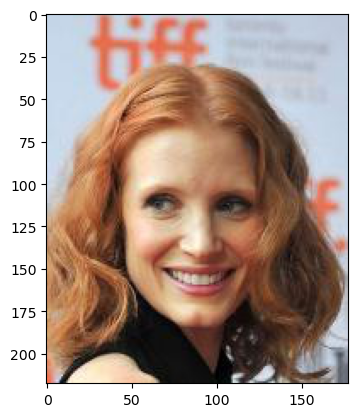

In [68]:
import random

from tensorflow.keras.utils import load_img
print(tf.__version__)
filenames = os.listdir("/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/")
sample = random.choice(filenames)
image = load_img("/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/"+sample)
plt.imshow(image)

In [15]:
# Load CelebA dataset annotations
df = pd.read_csv('/kaggle/input/celeba-dataset/list_attr_celeba.csv')
df

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
202595,202596.jpg,-1,-1,-1,-1,-1,1,1,-1,-1,...,-1,1,1,-1,-1,-1,-1,-1,-1,1
202596,202597.jpg,-1,-1,-1,-1,-1,-1,-1,-1,1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
202597,202598.jpg,-1,1,1,-1,-1,-1,1,-1,1,...,-1,1,-1,1,1,-1,1,-1,-1,1


# taking a random sample for faster training

In [4]:
# Take a random sample of the dataset
df_sample = df.sample(n=20000, replace=False)


# for R1 just choosing ['Smiling', 'Young', 'Male', 'Oval_Face']

In [30]:
# Define target attributes
targets = ['Smiling', 'Young', 'Male', 'Oval_Face']


In [31]:
# Split data into train and validation sets
train_size = int(len(df_sample) * 0.9)
train_df = df_sample[:train_size]
val_df = df_sample[train_size:]


In [20]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
# Define data generators for train and validation sets
datagen_train = ImageDataGenerator(rescale=1./255,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   zoom_range=0.1,
                                   rotation_range=10)
datagen_val = ImageDataGenerator(rescale=1./255)

train_generator = datagen_train.flow_from_dataframe(dataframe=train_df,
                                                     directory='/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/',
                                                     x_col='image_id',
                                                     y_col=targets,
                                                     batch_size=32,
                                                     class_mode='raw',
                                                     target_size=(224, 224))

val_generator = datagen_val.flow_from_dataframe(dataframe=val_df,
                                                 directory='/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/',
                                                 x_col='image_id',
                                                 y_col=targets,
                                                 batch_size=32,
                                                 class_mode='raw',
                                                 target_size=(224, 224))


Found 18000 validated image filenames.
Found 2000 validated image filenames.


In [21]:
# Load pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 0s 0us/step


In [32]:
# Add custom classification head
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(targets), activation='sigmoid')(x)


In [33]:
# Define multi-target classification model
model = Model(inputs=base_model.input, outputs=predictions)

In [34]:
# Compile model with binary cross-entropy loss and Adam optimizer
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [25]:
# Train model for 5 epochs
history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=5,
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/5
563/563 [==============================] - 336s 569ms/step - loss: nan - accuracy: 0.4882 - val_loss: nan - val_accuracy: 0.5190
Epoch 2/5
563/563 [==============================] - 258s 457ms/step - loss: nan - accuracy: 0.5012 - val_loss: nan - val_accuracy: 0.5190
Epoch 3/5
563/563 [==============================] - 249s 442ms/step - loss: nan - accuracy: 0.5012 - val_loss: nan - val_accuracy: 0.5190
Epoch 4/5
563/563 [==============================] - 251s 446ms/step - loss: nan - accuracy: 0.5012 - val_loss: nan - val_accuracy: 0.5190
Epoch 5/5
563/563 [==============================] - 251s 445ms/step - loss: nan - accuracy: 0.5012 - val_loss: nan - val_accuracy: 0.5190


**** The validation accuracy was found to be 51.90% on taking the target attributes as 'Smiling', 'Young', 'Male', 'Oval_Face'

****The above model has been made based on vgg16 model , we use vgg16 to pretrain our model in the first 15 layers and then we made our changes in the last layer,  Firstly we read the CelebA dataset and then we read the required file for the task in R1,ie the list attributes of celebA, and selecting the images with annotations for smiling, young, male, and oval face.Then doing Data Augmentation and then dividing the dataset into testing ,training and splitting and then training on vgg16 model and then compiling the model and then checking the test accuracy.

In [40]:
# Evaluate model on test set
test_df = pd.read_csv('/kaggle/input/celeba-dataset/list_eval_partition.csv')


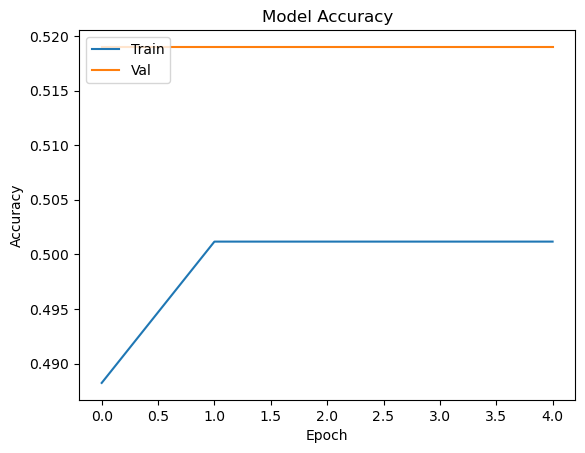

In [42]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# plotting the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

In [61]:
# Load test data

test_df = pd.read_csv('/kaggle/input/celeba-dataset/list_attr_celeba.csv')


test_df = test_df[['image_id'] + targets]
test_df = test_df.replace(to_replace=-1, value=0) # Replace -1 with 0
datagen_test = ImageDataGenerator(rescale=1./255)
test_generator = datagen_test.flow_from_dataframe(dataframe=test_df,
                                                  directory='/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/',
                                                  x_col='image_id',
                                                  y_col=targets,
                                                  batch_size=32,
                                                  class_mode='raw',
                                                  target_size=(224, 224))



Found 202599 validated image filenames.


In [63]:
test_generator.reset()
pred = model.predict(test_generator, verbose=1)
predicted_class_indices = np.round(pred)
test_labels = test_df[targets].values
accuracy = np.mean(np.all(predicted_class_indices == test_labels, axis=1))
print('Test accuracy:', accuracy)

6332/6332 [==============================] - 602s 95ms/step
Test accuracy: 0.020360416389024624


# ****Thus we found the testing accuracy for R1

Found 202599 validated image filenames.


Found 202599 validated image filenames.
